In [1]:
import json
import os 
from PIL import Image
import cv2 as cv2
import numpy as np
import math
import imutils
import random

import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
IMAGES_PATH = '/home/abert/Documents/NumeriCube/eurosilicone/angle/ds/TEST_MODEL_1/train/'  
OUTPUT_PATH = '/home/abert/Documents/NumeriCube/eurosilicone/angle/ds/TEST_MODEL_1/train_rotated/'
images = os.listdir(IMAGES_PATH)

for index, im in enumerate(images):
    
    print(im)
    img = cv2.imread(IMAGES_PATH + im)

    angle = random.randint(0,360)

    img3 = imutils.rotate(img,angle)
    
    cv2.imwrite( OUTPUT_PATH+im, img3 )

    print('image ', index, 'done')
        
        
    print('finito')

FULL-2019-04-26-154943.png
image  0 done
finito
FULL-2019-04-26-161428.png
image  1 done
finito
FULL-2019-04-26-143540.png
image  2 done
finito
FULL-2019-04-26-154625.png
image  3 done
finito
FULL-2019-04-26-153821.png
image  4 done
finito
FULL-2019-04-26-160716.png
image  5 done
finito
FULL-2019-04-26-150032.png
image  6 done
finito
FULL-2019-04-26-154813.png
image  7 done
finito
FULL-2019-04-26-153839.png
image  8 done
finito
FULL-2019-04-26-140922.png
image  9 done
finito
FULL-2019-04-26-144803.png
image  10 done
finito
FULL-2019-04-26-144550.png
image  11 done
finito
FULL-2019-04-26-161049.png
image  12 done
finito
FULL-2019-04-26-145333.png
image  13 done
finito
FULL-2019-04-26-154317.png
image  14 done
finito
FULL-2019-04-26-145352.png
image  15 done
finito
FULL-2019-04-26-144532.png
image  16 done
finito
FULL-2019-04-26-153019.png
image  17 done
finito
FULL-2019-04-26-155958.png
image  18 done
finito
FULL-2019-04-26-160624.png
image  19 done
finito
FULL-2019-04-26-151313.png
ima

In [2]:
from keras.models import load_model
import numpy as np
from keras.preprocessing import image
from keras import backend as K





def classify(im,model):
    """Classifies an image (np array or keras array)
        See here for difference:
        https://stackoverflow.com/questions/53718409/numpy-array-vs-img-to-array
    Parameters:
    im: numpy array
        The image to classify
    Returns:
    classe[0] : int
        in [0, 1, 2] corresponding to ['godet-vide', 'pet-clair', 'pet-fonce']
    or 
    in [0, 1, 2, 3] corresponding to ['godet-vide', 'pe-hd-opaque','pet-clair', 'pet-fonce']
    
    depending on which trained model is used.
   """


    classe = model.predict(im)
    classe =classe.argmax(axis = -1) #taking index of the maximum %
    return classe[0]

def angle_difference(x, y):
    """
    Calculate minimum difference between two angles.
    """
    return 180 - abs(abs(x - y) - 180)


def angle_error(y_true, y_pred):
    """
    Calculate the mean diference between the true angles
    and the predicted angles. Each angle is represented
    as a binary vector.
    """
    diff = angle_difference(K.argmax(y_true), K.argmax(y_pred))
    print(K.argmax(y_true), K.argmax(y_pred))
    return K.mean(K.cast(K.abs(diff), K.floatx()))


dcode ={'0': 0, '1': 1, '10': 2, '100': 3, '101': 4, '102': 5, '103': 6, '104': 7, '105': 8, '106': 9, '107': 10, '108': 11, '109': 12, '11': 13, '110': 14, '111': 15, '112': 16, '113': 17, '114': 18, '115': 19, '116': 20, '117': 21, '118': 22, '119': 23, '12': 24, '120': 25, '121': 26, '122': 27, '123': 28, '124': 29, '125': 30, '126': 31, '127': 32, '128': 33, '129': 34, '13': 35, '130': 36, '131': 37, '132': 38, '133': 39, '134': 40, '135': 41, '136': 42, '137': 43, '138': 44, '139': 45, '14': 46, '140': 47, '141': 48, '142': 49, '143': 50, '144': 51, '145': 52, '146': 53, '147': 54, '148': 55, '149': 56, '15': 57, '150': 58, '151': 59, '152': 60, '153': 61, '154': 62, '155': 63, '156': 64, '157': 65, '158': 66, '159': 67, '16': 68, '160': 69, '161': 70, '162': 71, '163': 72, '164': 73, '165': 74, '166': 75, '167': 76, '168': 77, '169': 78, '17': 79, '170': 80, '171': 81, '172': 82, '173': 83, '174': 84, '175': 85, '176': 86, '177': 87, '178': 88, '179': 89, '18': 90, '180': 91, '181': 92, '182': 93, '183': 94, '184': 95, '185': 96, '186': 97, '187': 98, '188': 99, '189': 100, '19': 101, '190': 102, '191': 103, '192': 104, '193': 105, '194': 106, '195': 107, '196': 108, '197': 109, '198': 110, '199': 111, '2': 112, '20': 113, '200': 114, '201': 115, '202': 116, '203': 117, '204': 118, '205': 119, '206': 120, '207': 121, '208': 122, '209': 123, '21': 124, '210': 125, '211': 126, '212': 127, '213': 128, '214': 129, '215': 130, '216': 131, '217': 132, '218': 133, '219': 134, '22': 135, '220': 136, '221': 137, '222': 138, '223': 139, '224': 140, '225': 141, '226': 142, '227': 143, '228': 144, '229': 145, '23': 146, '230': 147, '231': 148, '232': 149, '233': 150, '234': 151, '235': 152, '236': 153, '237': 154, '238': 155, '239': 156, '24': 157, '240': 158, '241': 159, '242': 160, '243': 161, '244': 162, '245': 163, '246': 164, '247': 165, '248': 166, '249': 167, '25': 168, '250': 169, '251': 170, '252': 171, '253': 172, '254': 173, '255': 174, '256': 175, '257': 176, '258': 177, '259': 178, '26': 179, '260': 180, '261': 181, '262': 182, '263': 183, '264': 184, '265': 185, '266': 186, '267': 187, '268': 188, '269': 189, '27': 190, '270': 191, '271': 192, '272': 193, '273': 194, '274': 195, '275': 196, '276': 197, '277': 198, '278': 199, '279': 200, '28': 201, '280': 202, '281': 203, '282': 204, '283': 205, '284': 206, '285': 207, '286': 208, '287': 209, '288': 210, '289': 211, '29': 212, '290': 213, '291': 214, '292': 215, '293': 216, '294': 217, '295': 218, '296': 219, '297': 220, '298': 221, '299': 222, '3': 223, '30': 224, '300': 225, '301': 226, '302': 227, '303': 228, '304': 229, '305': 230, '306': 231, '307': 232, '308': 233, '309': 234, '31': 235, '310': 236, '311': 237, '312': 238, '313': 239, '314': 240, '315': 241, '316': 242, '317': 243, '318': 244, '319': 245, '32': 246, '320': 247, '321': 248, '322': 249, '323': 250, '324': 251, '325': 252, '326': 253, '327': 254, '328': 255, '329': 256, '33': 257, '330': 258, '331': 259, '332': 260, '333': 261, '334': 262, '335': 263, '336': 264, '337': 265, '338': 266, '339': 267, '34': 268, '340': 269, '341': 270, '342': 271, '343': 272, '344': 273, '345': 274, '346': 275, '347': 276, '348': 277, '349': 278, '35': 279, '350': 280, '351': 281, '352': 282, '353': 283, '354': 284, '355': 285, '356': 286, '357': 287, '358': 288, '359': 289, '36': 290, '37': 291, '38': 292, '39': 293, '4': 294, '40': 295, '41': 296, '42': 297, '43': 298, '44': 299, '45': 300, '46': 301, '47': 302, '48': 303, '49': 304, '5': 305, '50': 306, '51': 307, '52': 308, '53': 309, '54': 310, '55': 311, '56': 312, '57': 313, '58': 314, '59': 315, '6': 316, '60': 317, '61': 318, '62': 319, '63': 320, '64': 321, '65': 322, '66': 323, '67': 324, '68': 325, '69': 326, '7': 327, '70': 328, '71': 329, '72': 330, '73': 331, '74': 332, '75': 333, '76': 334, '77': 335, '78': 336, '79': 337, '8': 338, '80': 339, '81': 340, '82': 341, '83': 342, '84': 343, '85': 344, '86': 345, '87': 346, '88': 347, '89': 348, '9': 349, '90': 350, '91': 351, '92': 352, '93': 353, '94': 354, '95': 355, '96': 356, '97': 357, '98': 358, '99': 359}



"""

def main():

    HEIGHT = 224
    WIDTH = 224

    model = load_model('vide_petc_petf-vgg16-20190423141400.h5')

    im_path = './dataset/wsEN4iv2SliFUuYNXIM-5Q_0b9FT9bgTKSFE4NaMtMCwA_320x200.png'

    img = image.load_img(im_path, target_size=(HEIGHT, WIDTH)) #resize
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)# correct shape for classification

    print(classify(img,model))

"""

Using TensorFlow backend.


"\n\ndef main():\n\n    HEIGHT = 224\n    WIDTH = 224\n\n    model = load_model('vide_petc_petf-vgg16-20190423141400.h5')\n\n    im_path = './dataset/wsEN4iv2SliFUuYNXIM-5Q_0b9FT9bgTKSFE4NaMtMCwA_320x200.png'\n\n    img = image.load_img(im_path, target_size=(HEIGHT, WIDTH)) #resize\n    img = image.img_to_array(img)\n    img = np.expand_dims(img, axis=0)# correct shape for classification\n\n    print(classify(img,model))\n\n"

Instructions for updating:
Colocations handled automatically by placer.
Tensor("metrics/angle_error/ArgMax_2:0", shape=(?,), dtype=int64) Tensor("metrics/angle_error/ArgMax_3:0", shape=(?,), dtype=int64)
Instructions for updating:
Use tf.cast instead.
FULL-2019-04-26-154943.png


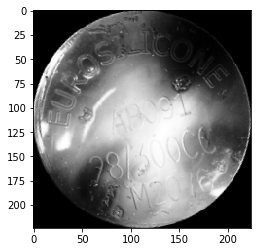

Time =  3.220562219619751
Classe =  91
Angle = 351


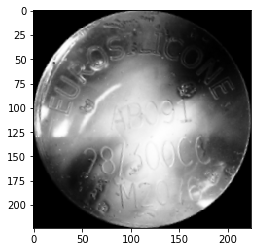

finito
FULL-2019-04-26-161428.png


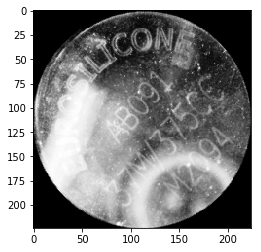

Time =  0.05000734329223633
Classe =  91
Angle = 351


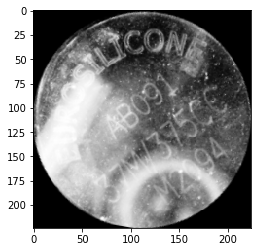

finito
FULL-2019-04-26-143540.png


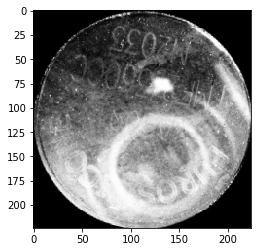

Time =  0.05042314529418945
Classe =  91
Angle = 351


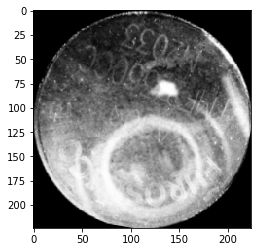

finito
FULL-2019-04-26-154625.png


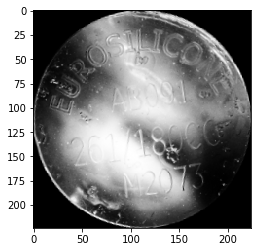

Time =  0.05034685134887695
Classe =  91
Angle = 351


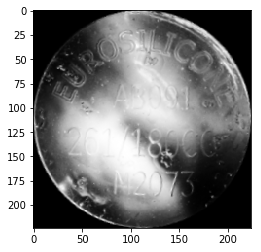

finito
FULL-2019-04-26-153821.png


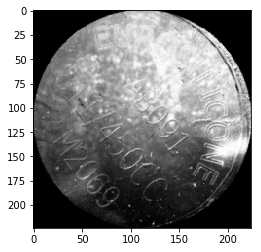

Time =  0.05083155632019043
Classe =  350
Angle = 280


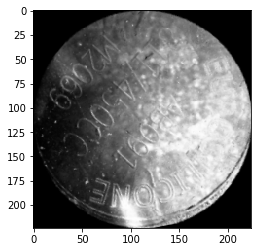

finito
FULL-2019-04-26-160716.png


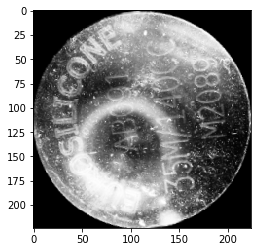

Time =  0.05016279220581055
Classe =  91
Angle = 351


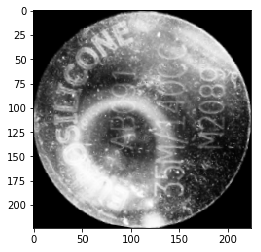

finito
FULL-2019-04-26-150032.png


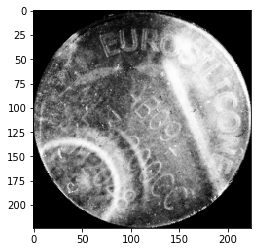

Time =  0.04932570457458496
Classe =  350
Angle = 280


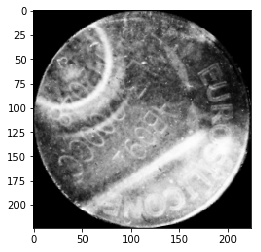

finito
FULL-2019-04-26-154813.png


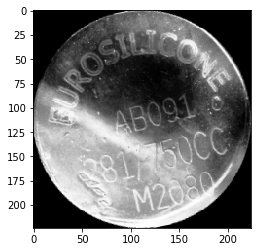

Time =  0.05463123321533203
Classe =  91
Angle = 351


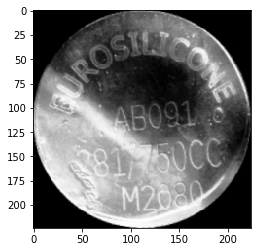

finito
FULL-2019-04-26-153839.png


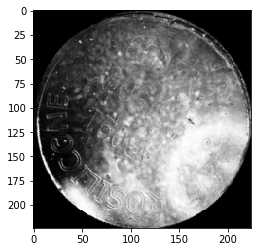

Time =  0.04949760437011719
Classe =  91
Angle = 351


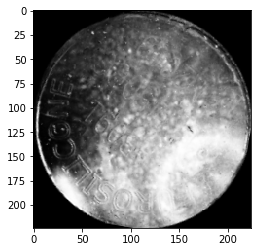

finito
FULL-2019-04-26-140922.png


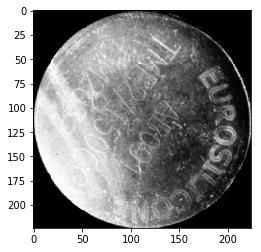

Time =  0.05211281776428223
Classe =  91
Angle = 351


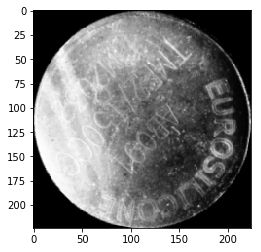

finito
FULL-2019-04-26-144803.png


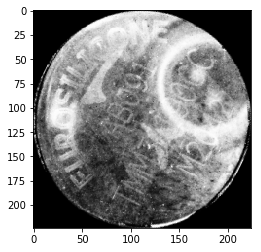

Time =  0.05363297462463379
Classe =  350
Angle = 280


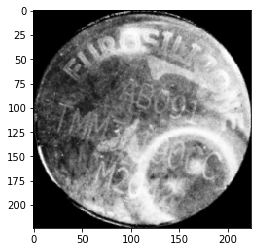

finito
FULL-2019-04-26-144550.png


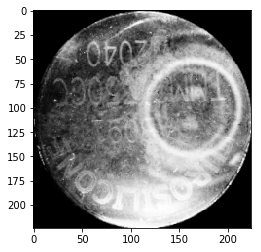

Time =  0.05044913291931152
Classe =  91
Angle = 351


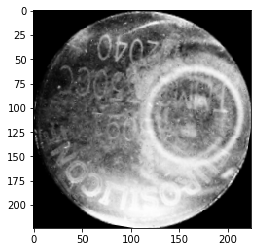

finito
FULL-2019-04-26-161049.png


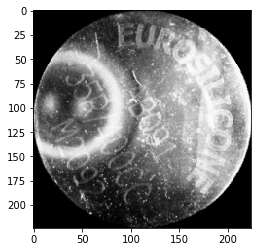

Time =  0.05534863471984863
Classe =  350
Angle = 280


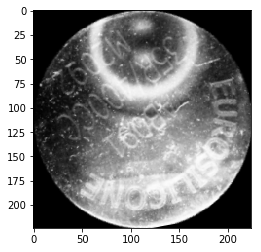

finito
FULL-2019-04-26-145333.png


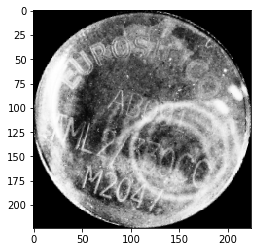

Time =  0.050290584564208984
Classe =  91
Angle = 351


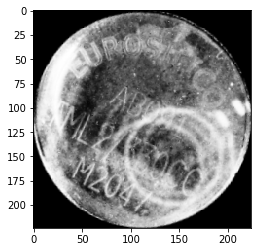

finito
FULL-2019-04-26-154317.png


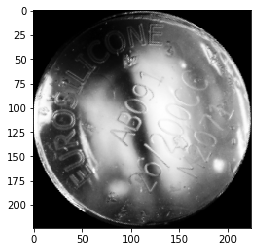

Time =  0.05363154411315918
Classe =  350
Angle = 280


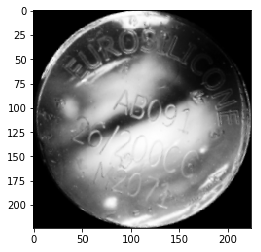

finito
FULL-2019-04-26-145352.png


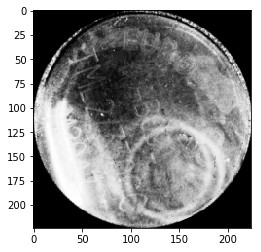

Time =  0.057361602783203125
Classe =  91
Angle = 351


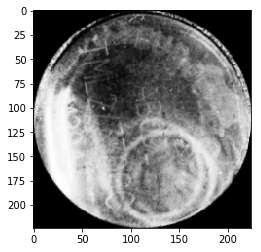

finito
FULL-2019-04-26-144532.png


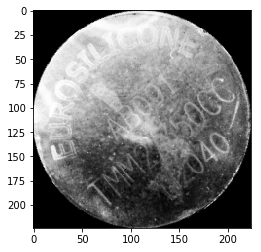

Time =  0.04950833320617676
Classe =  244
Angle = 162


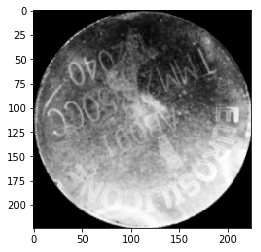

finito
FULL-2019-04-26-153019.png


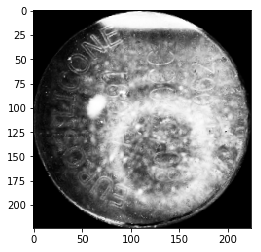

Time =  0.05465841293334961
Classe =  350
Angle = 280


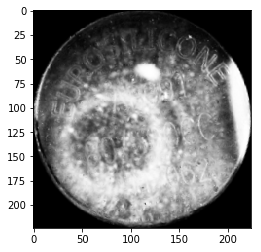

finito
FULL-2019-04-26-155958.png


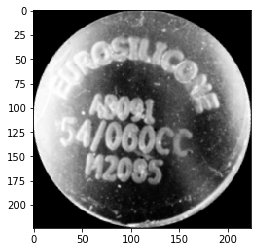

Time =  0.04935193061828613
Classe =  91
Angle = 351


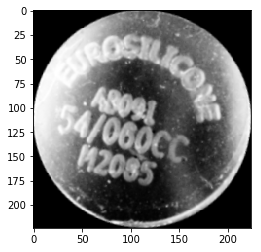

finito
FULL-2019-04-26-160624.png


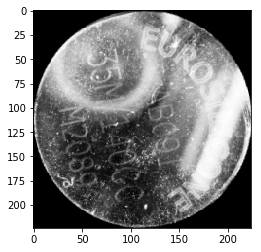

Time =  0.053476572036743164
Classe =  0
Angle = 0


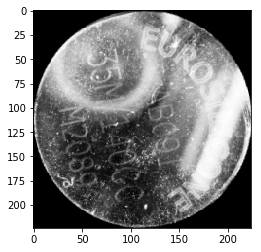

finito
FULL-2019-04-26-151313.png


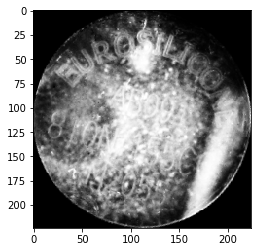

Time =  0.05310773849487305
Classe =  350
Angle = 280


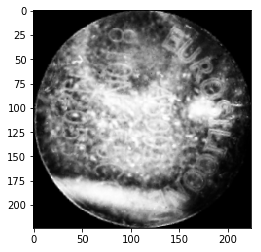

finito
FULL-2019-04-26-143352.png


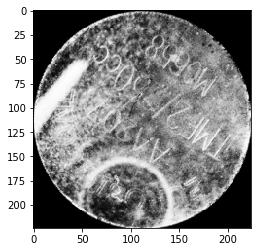

Time =  0.05534672737121582
Classe =  350
Angle = 280


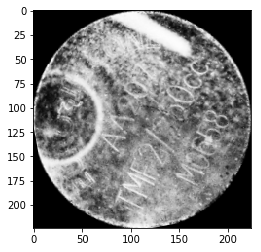

finito
FULL-2019-04-26-154257.png


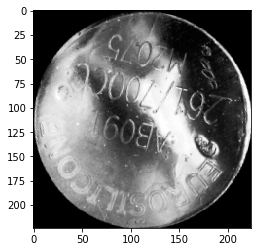

Time =  0.05037379264831543
Classe =  91
Angle = 351


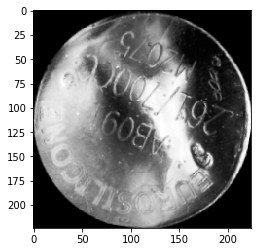

finito
FULL-2019-04-26-145513.png


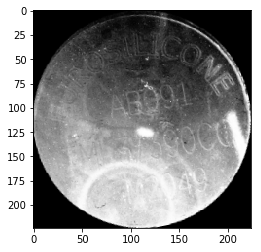

Time =  0.049419403076171875
Classe =  91
Angle = 351


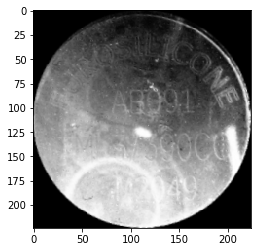

finito
FULL-2019-04-26-145657.png


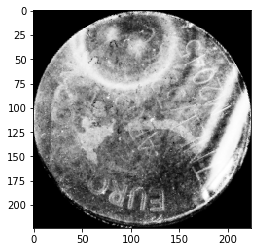

Time =  0.056209564208984375
Classe =  350
Angle = 280


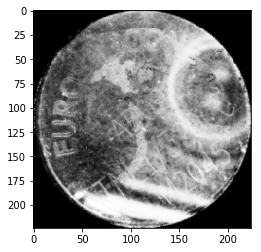

finito
FULL-2019-04-26-142201.png


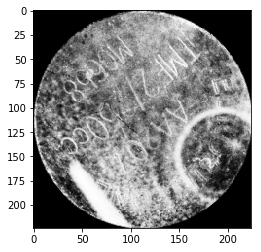

Time =  0.055880069732666016
Classe =  91
Angle = 351


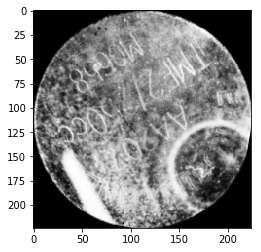

finito
FULL-2019-04-26-143453.png


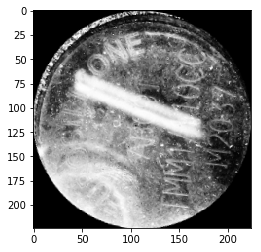

Time =  0.05301189422607422
Classe =  91
Angle = 351


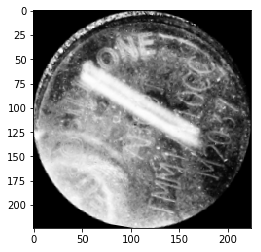

finito
FULL-2019-04-26-143558.png


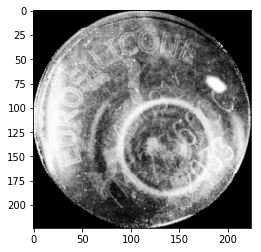

Time =  0.05047941207885742
Classe =  350
Angle = 280


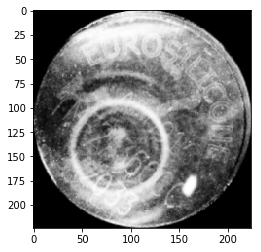

finito
FULL-2019-04-26-145711.png


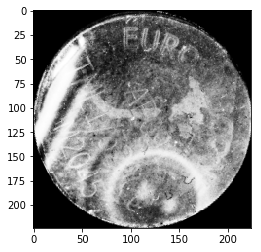

Time =  0.049957275390625
Classe =  91
Angle = 351


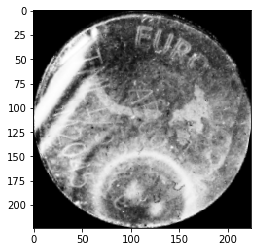

finito
FULL-2019-04-26-143701.png


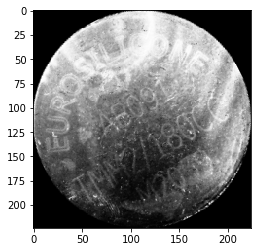

Time =  0.05463433265686035
Classe =  0
Angle = 0


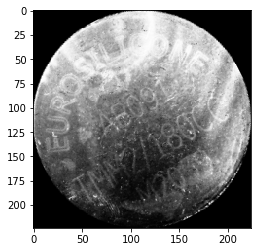

finito
FULL-2019-04-26-154236.png


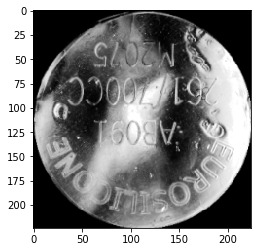

Time =  0.05039477348327637
Classe =  91
Angle = 351


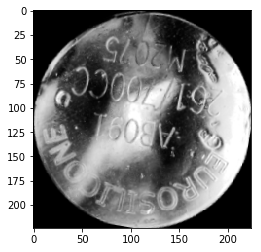

finito
FULL-2019-04-26-161718.png


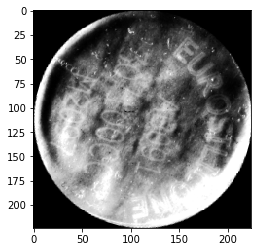

Time =  0.05821561813354492
Classe =  91
Angle = 351


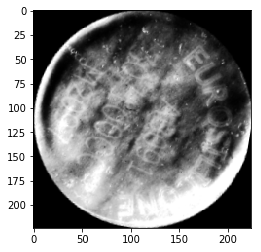

finito
FULL-2019-04-26-152239.png


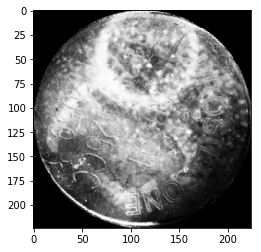

Time =  0.05582261085510254
Classe =  350
Angle = 280


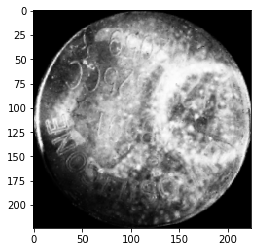

finito
FULL-2019-04-26-154831.png


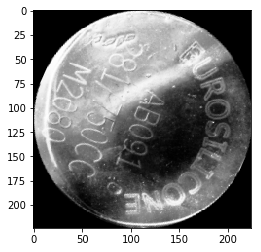

Time =  0.05265069007873535
Classe =  0
Angle = 0


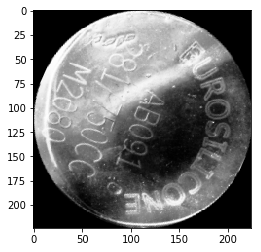

finito
FULL-2019-04-26-155521.png


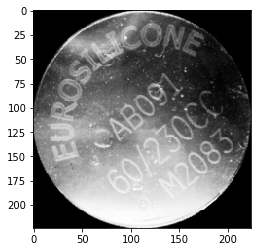

Time =  0.04914522171020508
Classe =  91
Angle = 351


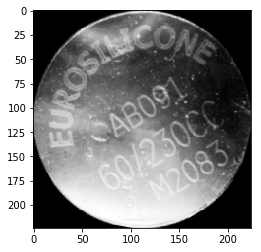

finito
FULL-2019-04-26-154743.png


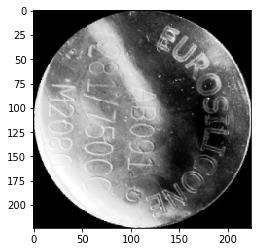

Time =  0.05828523635864258
Classe =  91
Angle = 351


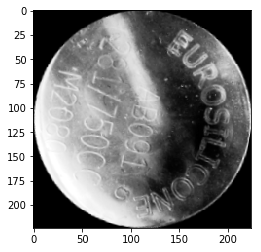

finito
FULL-2019-04-26-154428.png


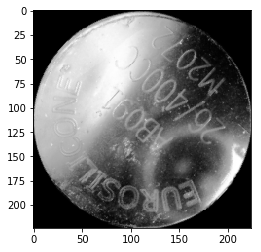

Time =  0.05024003982543945
Classe =  91
Angle = 351


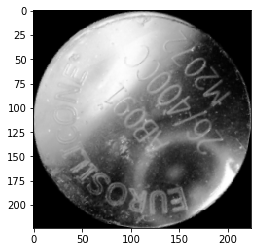

finito
FULL-2019-04-26-153807.png


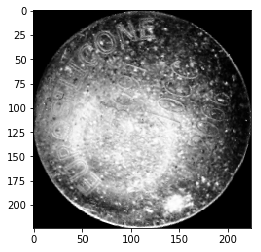

Time =  0.055419206619262695
Classe =  350
Angle = 280


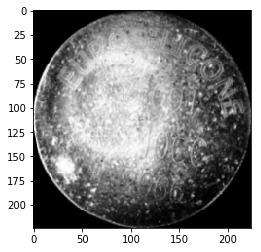

finito
FULL-2019-04-26-142147.png


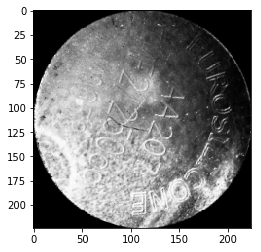

Time =  0.052805423736572266
Classe =  91
Angle = 351


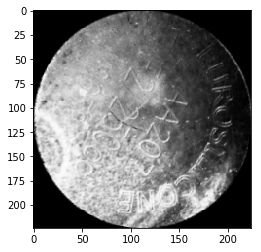

finito
FULL-2019-04-26-152959.png


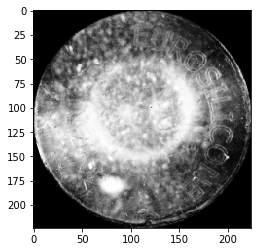

Time =  0.04954338073730469
Classe =  350
Angle = 280


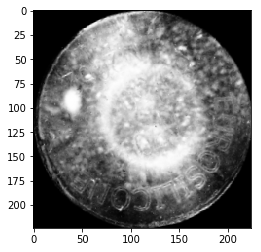

finito
FULL-2019-04-26-160302.png


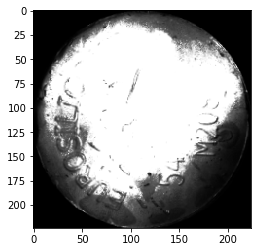

Time =  0.04992818832397461
Classe =  350
Angle = 280


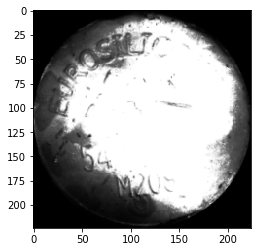

finito
FULL-2019-04-26-153252.png


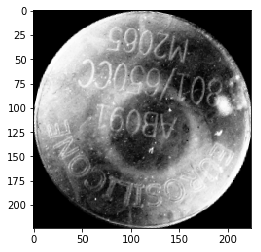

Time =  0.05750536918640137
Classe =  91
Angle = 351


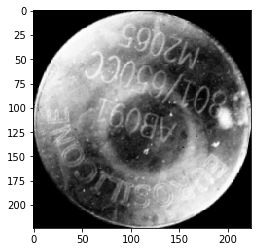

finito
FULL-2019-04-26-145917.png


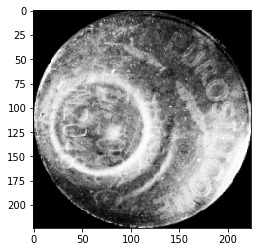

Time =  0.04900479316711426
Classe =  350
Angle = 280


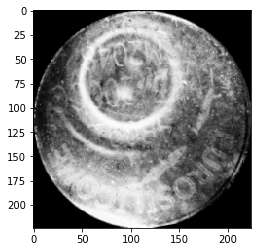

finito
FULL-2019-04-26-152151.png


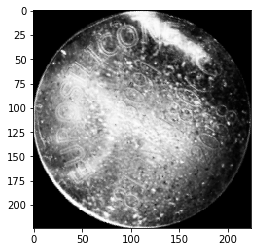

Time =  0.058953046798706055
Classe =  350
Angle = 280


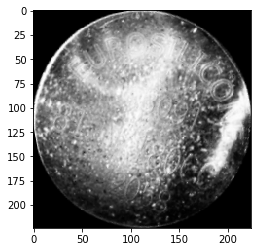

finito
FULL-2019-04-26-160642.png


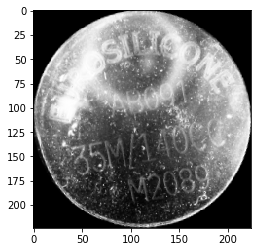

Time =  0.05260896682739258
Classe =  0
Angle = 0


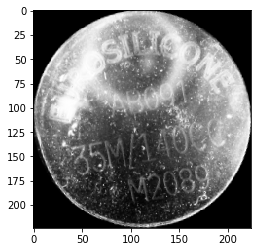

finito
FULL-2019-04-26-140908.png


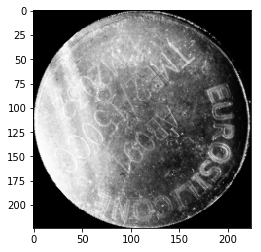

Time =  0.05252957344055176
Classe =  91
Angle = 351


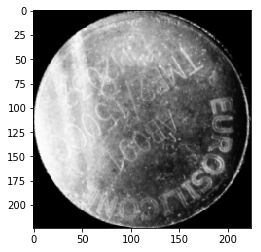

finito
FULL-2019-04-26-140853.png


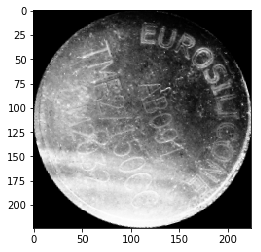

Time =  0.04970574378967285
Classe =  91
Angle = 351


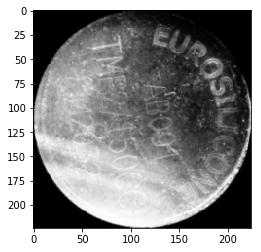

finito
FULL-2019-04-26-160316.png


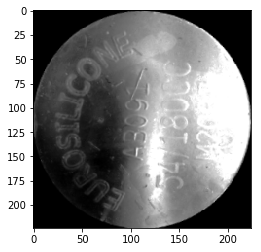

Time =  0.054637908935546875
Classe =  350
Angle = 280


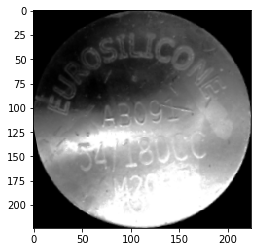

finito
FULL-2019-04-26-154759.png


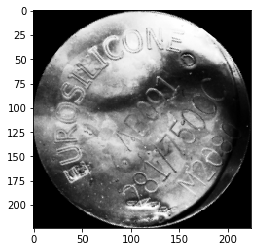

Time =  0.04956388473510742
Classe =  91
Angle = 351


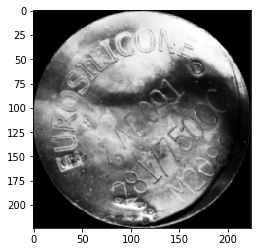

finito
FULL-2019-04-26-144227.png


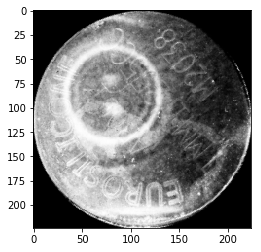

Time =  0.04994058609008789
Classe =  91
Angle = 351


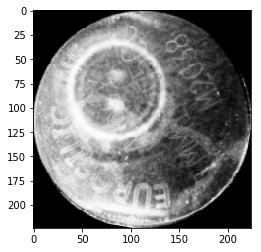

finito
FULL-2019-04-26-155823.png


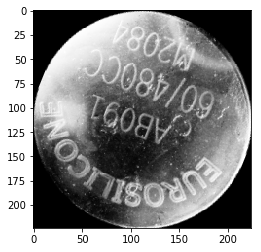

Time =  0.05825304985046387
Classe =  0
Angle = 0


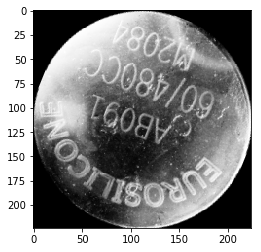

finito
FULL-2019-04-26-150809.png


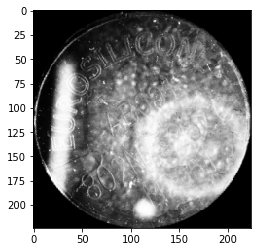

Time =  0.049800872802734375
Classe =  350
Angle = 280


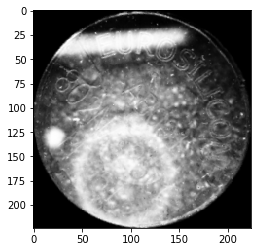

finito
FULL-2019-04-26-154414.png


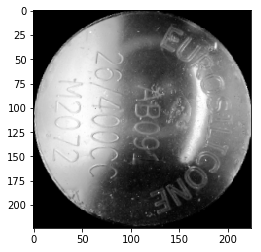

Time =  0.049759626388549805
Classe =  350
Angle = 280


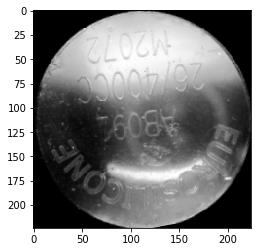

finito
FULL-2019-04-26-152220.png


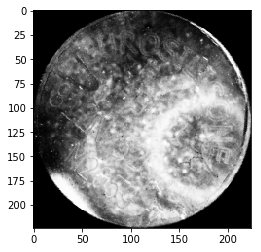

Time =  0.05049252510070801
Classe =  91
Angle = 351


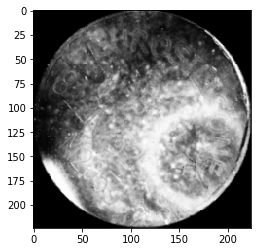

finito
FULL-2019-04-26-160938.png


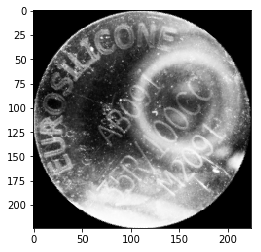

Time =  0.05252957344055176
Classe =  91
Angle = 351


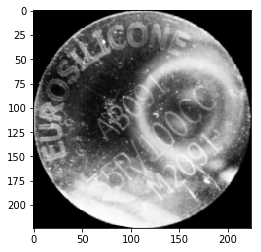

finito
FULL-2019-04-26-152316.png


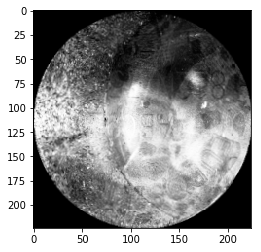

Time =  0.052327871322631836
Classe =  350
Angle = 280


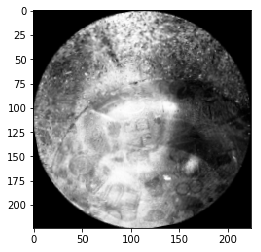

finito
FULL-2019-04-26-161500.png


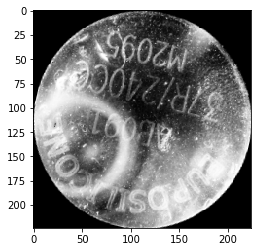

Time =  0.05744457244873047
Classe =  91
Angle = 351


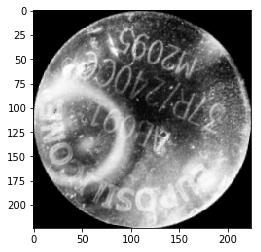

finito
FULL-2019-04-26-160919.png


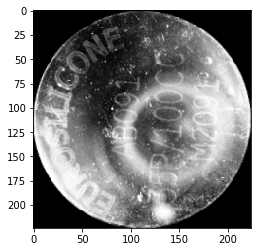

Time =  0.04955434799194336
Classe =  350
Angle = 280


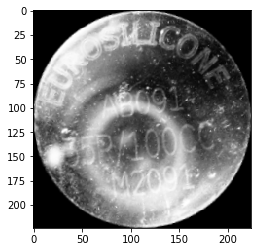

finito
FULL-2019-04-26-144335.png


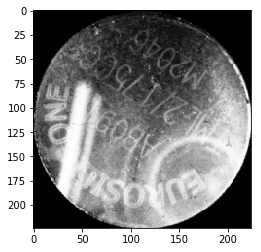

Time =  0.05791616439819336
Classe =  91
Angle = 351


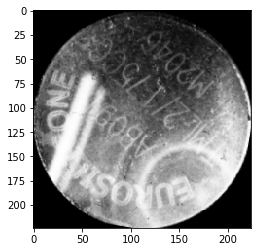

finito
FULL-2019-04-26-155056.png


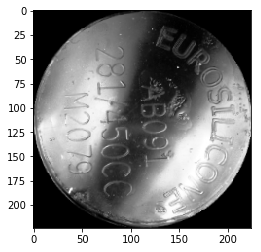

Time =  0.05282402038574219
Classe =  91
Angle = 351


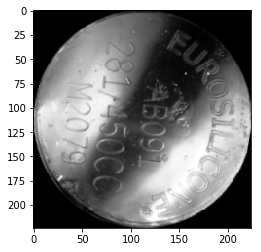

finito
FULL-2019-04-26-145454.png


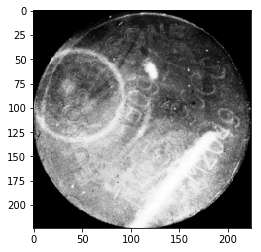

Time =  0.05856919288635254
Classe =  91
Angle = 351


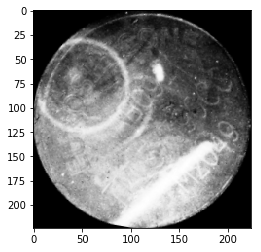

finito
FULL-2019-04-26-153537.png


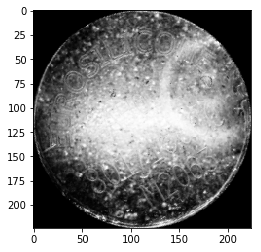

Time =  0.06303024291992188
Classe =  350
Angle = 280


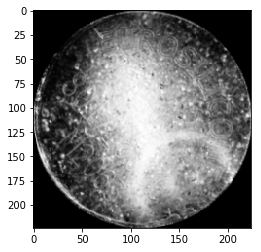

finito
FULL-2019-04-26-144514.png


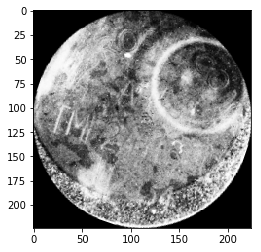

Time =  0.0539243221282959
Classe =  91
Angle = 351


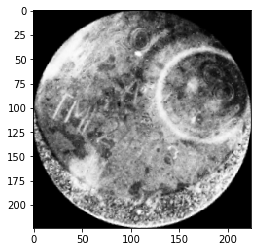

finito
FULL-2019-04-26-151138.png


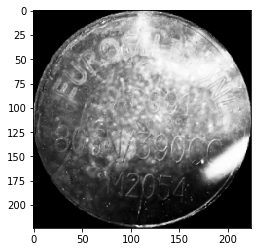

Time =  0.05274629592895508
Classe =  350
Angle = 280


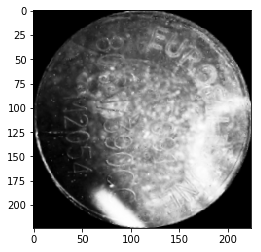

finito
FULL-2019-04-26-144124.png


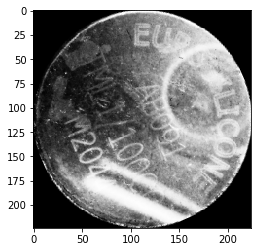

Time =  0.053503990173339844
Classe =  91
Angle = 351


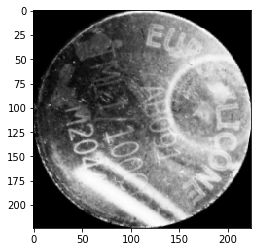

finito
FULL-2019-04-26-161112.png


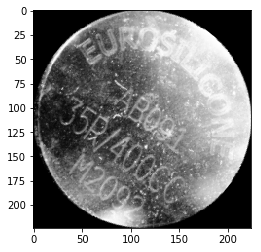

Time =  0.04937601089477539
Classe =  91
Angle = 351


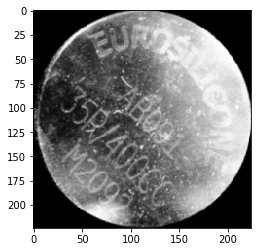

finito
FULL-2019-04-26-144244.png


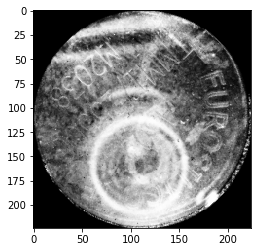

Time =  0.05832862854003906
Classe =  91
Angle = 351


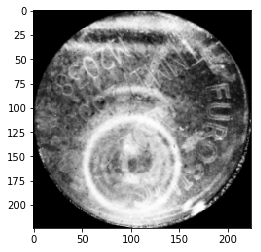

finito
FULL-2019-04-26-144746.png


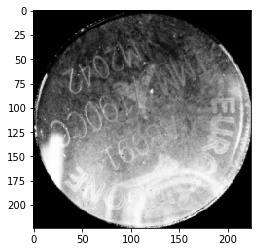

Time =  0.04939913749694824
Classe =  91
Angle = 351


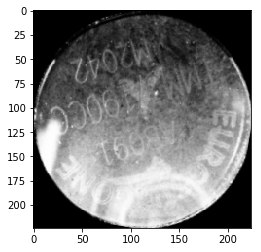

finito
FULL-2019-04-26-152351.png


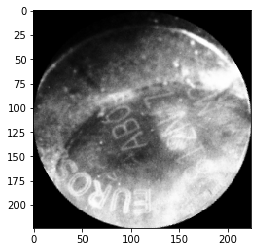

Time =  0.0502932071685791
Classe =  91
Angle = 351


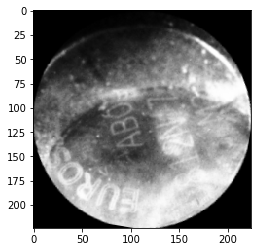

finito
FULL-2019-04-26-161301.png


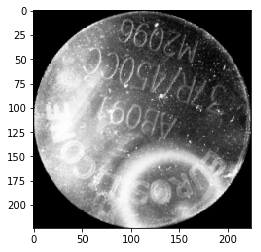

Time =  0.04980969429016113
Classe =  91
Angle = 351


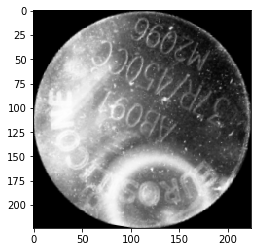

finito
FULL-2019-04-26-154607.png


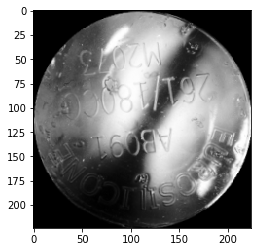

Time =  0.04976034164428711
Classe =  350
Angle = 280


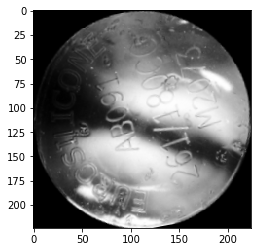

finito
FULL-2019-04-26-140937.png


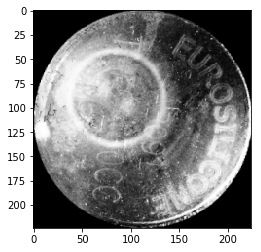

Time =  0.06040239334106445
Classe =  350
Angle = 280


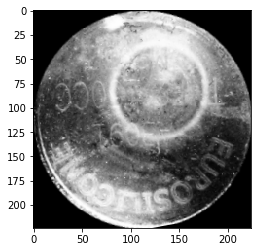

finito
FULL-2019-04-26-154701.png


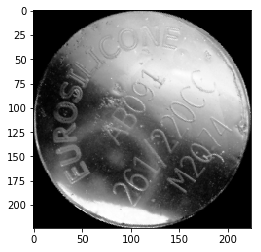

Time =  0.053666114807128906
Classe =  244
Angle = 162


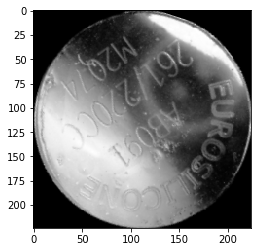

finito
FULL-2019-04-26-155431.png


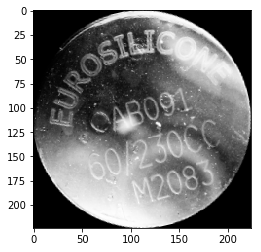

Time =  0.0493772029876709
Classe =  91
Angle = 351


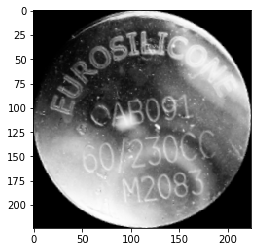

finito
FULL-2019-04-26-150014.png


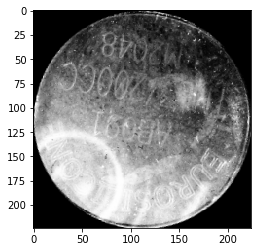

Time =  0.052750587463378906
Classe =  91
Angle = 351


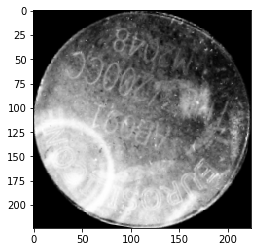

finito
FULL-2019-04-26-153518.png


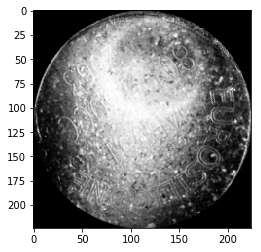

Time =  0.04965066909790039
Classe =  350
Angle = 280


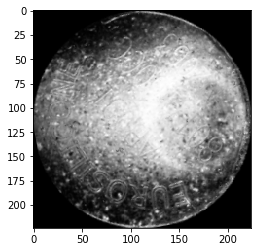

finito
FULL-2019-04-26-144705.png


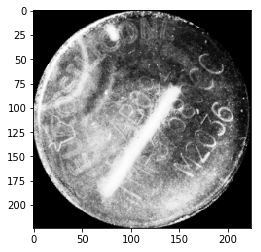

Time =  0.049807071685791016
Classe =  91
Angle = 351


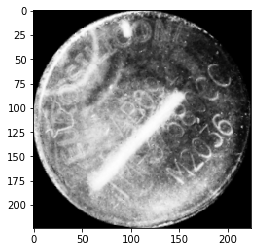

finito
FULL-2019-04-26-154336.png


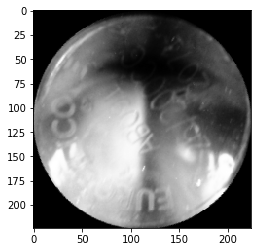

Time =  0.05354881286621094
Classe =  91
Angle = 351


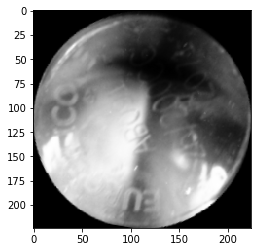

finito
FULL-2019-04-26-153551.png


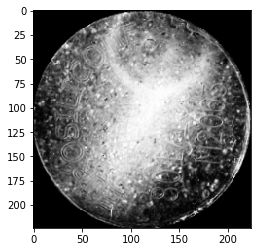

Time =  0.05268597602844238
Classe =  350
Angle = 280


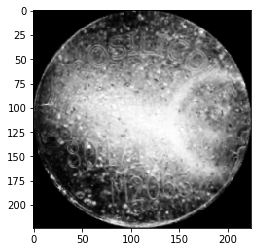

finito
FULL-2019-04-26-144853.png


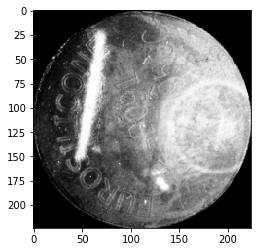

Time =  0.04991579055786133
Classe =  350
Angle = 280


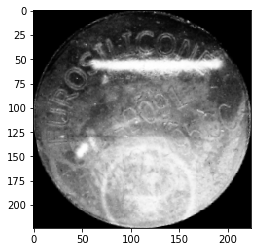

finito
FULL-2019-04-26-155404.png


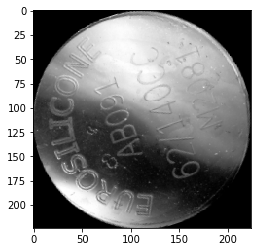

Time =  0.04951906204223633
Classe =  244
Angle = 162


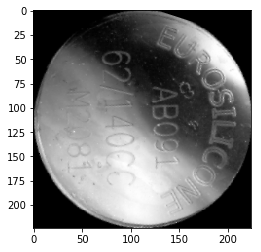

finito
FULL-2019-04-26-151326.png


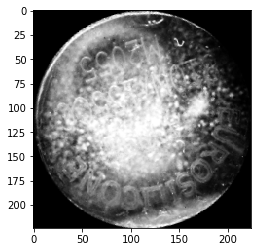

Time =  0.05334281921386719
Classe =  91
Angle = 351


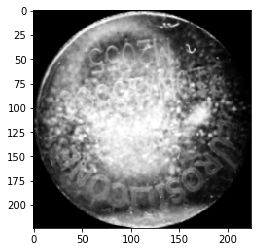

finito
FULL-2019-04-26-143643.png


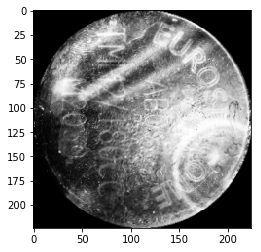

Time =  0.05750632286071777
Classe =  350
Angle = 280


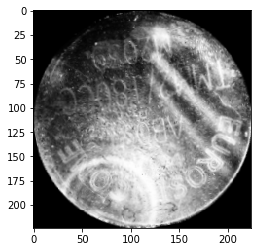

finito
FULL-2019-04-26-151151.png


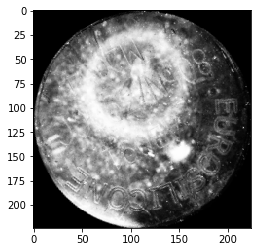

Time =  0.055371999740600586
Classe =  91
Angle = 351


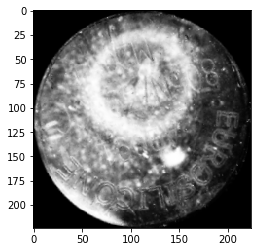

finito
FULL-2019-04-26-153744.png


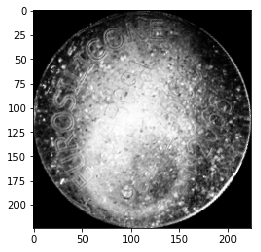

Time =  0.04983019828796387
Classe =  350
Angle = 280


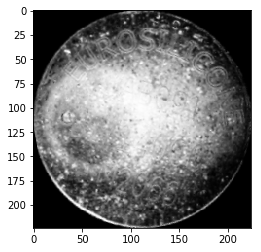

finito
FULL-2019-04-26-154720.png


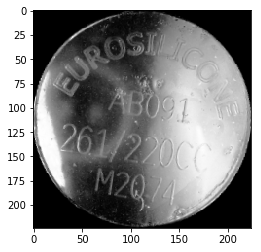

Time =  0.05441641807556152
Classe =  350
Angle = 280


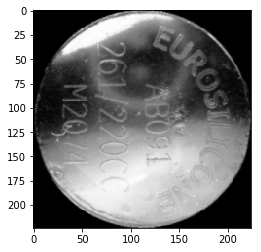

finito
FULL-2019-04-26-154643.png


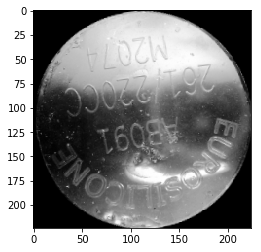

Time =  0.05518746376037598
Classe =  0
Angle = 0


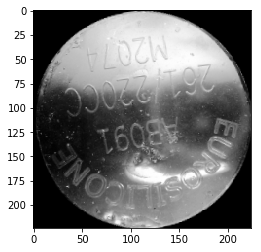

finito
FULL-2019-04-26-140622.png


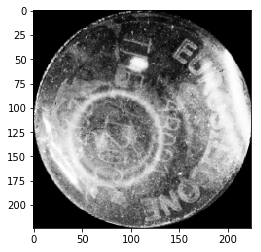

Time =  0.06472539901733398
Classe =  350
Angle = 280


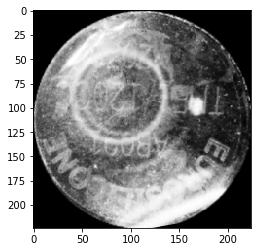

finito
FULL-2019-04-26-151440.png


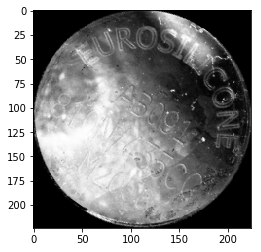

Time =  0.05276298522949219
Classe =  91
Angle = 351


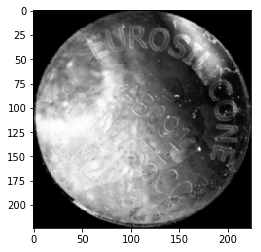

finito
FULL-2019-04-26-144442.png


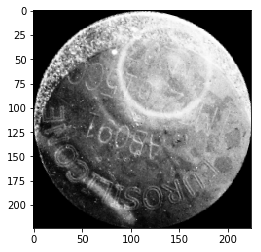

Time =  0.04997992515563965
Classe =  350
Angle = 280


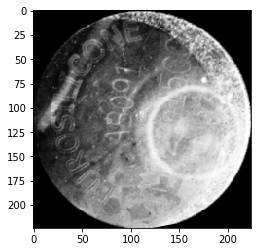

finito
FULL-2019-04-26-153915.png


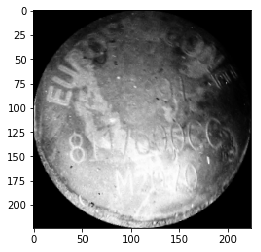

Time =  0.05443620681762695
Classe =  91
Angle = 351


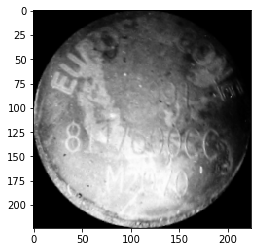

finito
FULL-2019-04-26-155504.png


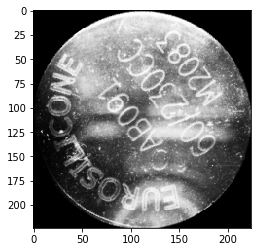

Time =  0.04960775375366211
Classe =  91
Angle = 351


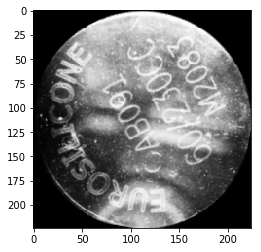

finito
FULL-2019-04-26-145956.png


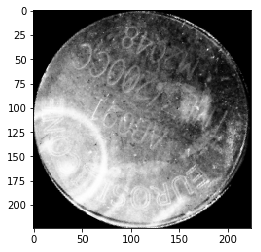

Time =  0.04951882362365723
Classe =  91
Angle = 351


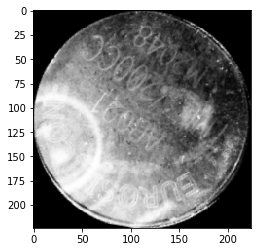

finito
FULL-2019-04-26-153500.png


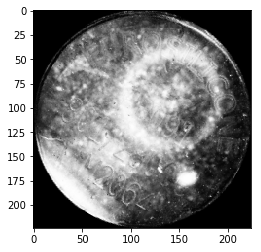

Time =  0.049566030502319336
Classe =  350
Angle = 280


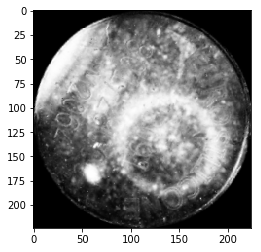

finito
FULL-2019-04-26-144317.png


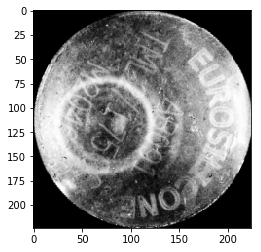

Time =  0.0496211051940918
Classe =  350
Angle = 280


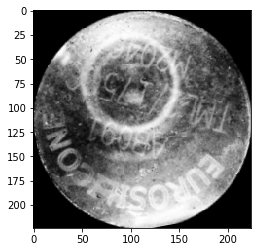

finito
FULL-2019-04-26-155135.png


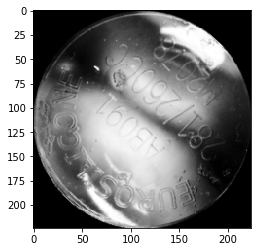

Time =  0.04948854446411133
Classe =  91
Angle = 351


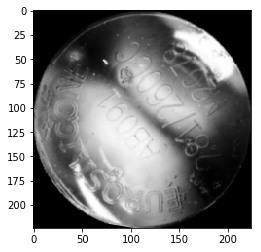

finito
FULL-2019-04-26-145938.png


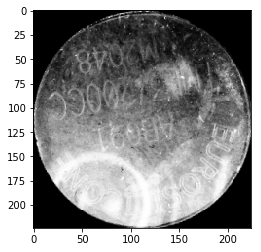

Time =  0.055492401123046875
Classe =  91
Angle = 351


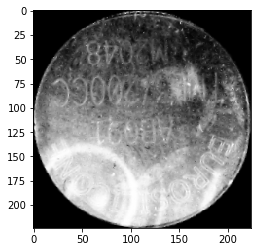

finito
FULL-2019-04-26-160356.png


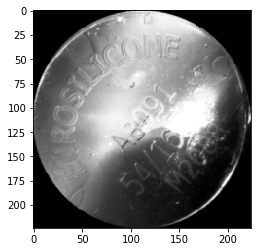

Time =  0.04924464225769043
Classe =  244
Angle = 162


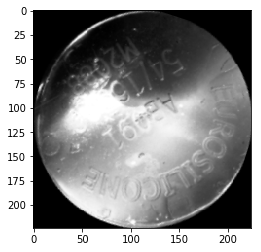

finito
FULL-2019-04-26-152206.png


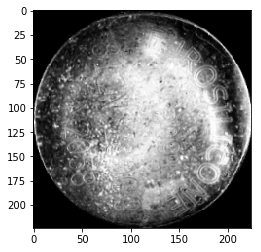

Time =  0.04969668388366699
Classe =  350
Angle = 280


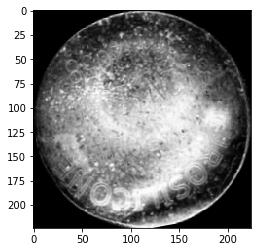

finito
FULL-2019-04-26-144952.png


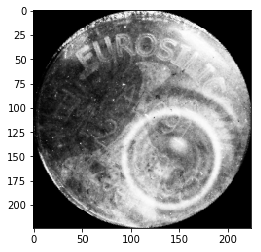

Time =  0.04993915557861328
Classe =  91
Angle = 351


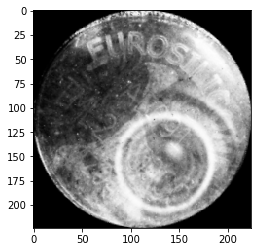

finito
FULL-2019-04-26-161915.png


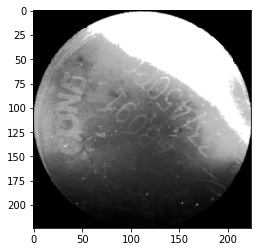

Time =  0.05035591125488281
Classe =  244
Angle = 162


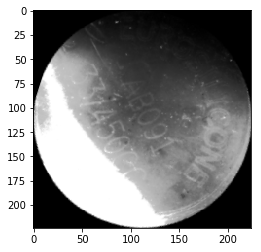

finito
FULL-2019-04-26-161849.png


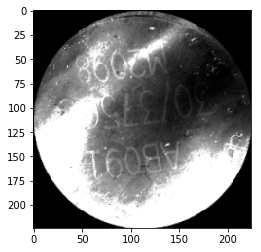

Time =  0.052870988845825195
Classe =  91
Angle = 351


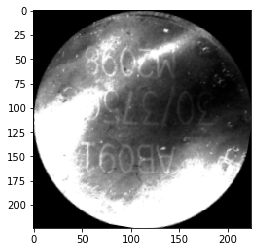

finito


In [3]:
import time


IMAGES_PATH = '/home/abert/Documents/NumeriCube/eurosilicone/angle/ds/TEST_MODEL_1/train_rotated/'
OUTPUT_PATH = '/home/abert/Documents/NumeriCube/eurosilicone/angle/ds/TEST_MODEL_1/train_corrected/'
images = os.listdir(IMAGES_PATH)
model = load_model('../models/training1/rotnet_chip_resnet50.hdf5',custom_objects={'angle_error': angle_error})



for index, im in enumerate(images):
    print(im)
    HEIGHT = 224
    WIDTH = 224
    
    """
    img = image.load_img(IMAGES_PATH+im, target_size=(HEIGHT, WIDTH)) #resize
    plt.imshow(img)
    plt.show()
    img = image.img_to_array(img)
    img2 = np.expand_dims(img, axis=0)# correct shape for classification
    """
    image = cv2.imread(IMAGES_PATH+im)
    plt.imshow(image)
    plt.show()
    image4 = np.expand_dims(image, axis=0)# correct shape for classification
    
    start = time. time()
    classe = classify(image4,model)
    end = time. time()
    print('Time = ',end - start)
    
    print('Classe = ', classe)
    angle_corr = dcode[str(classe)]
    print('Angle =',angle_corr)

    img3 = imutils.rotate(image,angle_corr)
    plt.imshow(img3)
    plt.show()
    '''
        output_dir = dir_final #+ str(k) + '/'
        print(output_dir)

        if not os.path.exists(output_dir):
            os.makedirs(output_dir)




        cv2.imwrite( output_dir+im, img3 )

    print('image ', k, 'done')
    """
    '''        
    print('finito')

In [4]:
dcode ={'0': 0, '1': 1, '10': 2, '100': 3, '101': 4, '102': 5, '103': 6, '104': 7, '105': 8, '106': 9, '107': 10, '108': 11, '109': 12, '11': 13, '110': 14, '111': 15, '112': 16, '113': 17, '114': 18, '115': 19, '116': 20, '117': 21, '118': 22, '119': 23, '12': 24, '120': 25, '121': 26, '122': 27, '123': 28, '124': 29, '125': 30, '126': 31, '127': 32, '128': 33, '129': 34, '13': 35, '130': 36, '131': 37, '132': 38, '133': 39, '134': 40, '135': 41, '136': 42, '137': 43, '138': 44, '139': 45, '14': 46, '140': 47, '141': 48, '142': 49, '143': 50, '144': 51, '145': 52, '146': 53, '147': 54, '148': 55, '149': 56, '15': 57, '150': 58, '151': 59, '152': 60, '153': 61, '154': 62, '155': 63, '156': 64, '157': 65, '158': 66, '159': 67, '16': 68, '160': 69, '161': 70, '162': 71, '163': 72, '164': 73, '165': 74, '166': 75, '167': 76, '168': 77, '169': 78, '17': 79, '170': 80, '171': 81, '172': 82, '173': 83, '174': 84, '175': 85, '176': 86, '177': 87, '178': 88, '179': 89, '18': 90, '180': 91, '181': 92, '182': 93, '183': 94, '184': 95, '185': 96, '186': 97, '187': 98, '188': 99, '189': 100, '19': 101, '190': 102, '191': 103, '192': 104, '193': 105, '194': 106, '195': 107, '196': 108, '197': 109, '198': 110, '199': 111, '2': 112, '20': 113, '200': 114, '201': 115, '202': 116, '203': 117, '204': 118, '205': 119, '206': 120, '207': 121, '208': 122, '209': 123, '21': 124, '210': 125, '211': 126, '212': 127, '213': 128, '214': 129, '215': 130, '216': 131, '217': 132, '218': 133, '219': 134, '22': 135, '220': 136, '221': 137, '222': 138, '223': 139, '224': 140, '225': 141, '226': 142, '227': 143, '228': 144, '229': 145, '23': 146, '230': 147, '231': 148, '232': 149, '233': 150, '234': 151, '235': 152, '236': 153, '237': 154, '238': 155, '239': 156, '24': 157, '240': 158, '241': 159, '242': 160, '243': 161, '244': 162, '245': 163, '246': 164, '247': 165, '248': 166, '249': 167, '25': 168, '250': 169, '251': 170, '252': 171, '253': 172, '254': 173, '255': 174, '256': 175, '257': 176, '258': 177, '259': 178, '26': 179, '260': 180, '261': 181, '262': 182, '263': 183, '264': 184, '265': 185, '266': 186, '267': 187, '268': 188, '269': 189, '27': 190, '270': 191, '271': 192, '272': 193, '273': 194, '274': 195, '275': 196, '276': 197, '277': 198, '278': 199, '279': 200, '28': 201, '280': 202, '281': 203, '282': 204, '283': 205, '284': 206, '285': 207, '286': 208, '287': 209, '288': 210, '289': 211, '29': 212, '290': 213, '291': 214, '292': 215, '293': 216, '294': 217, '295': 218, '296': 219, '297': 220, '298': 221, '299': 222, '3': 223, '30': 224, '300': 225, '301': 226, '302': 227, '303': 228, '304': 229, '305': 230, '306': 231, '307': 232, '308': 233, '309': 234, '31': 235, '310': 236, '311': 237, '312': 238, '313': 239, '314': 240, '315': 241, '316': 242, '317': 243, '318': 244, '319': 245, '32': 246, '320': 247, '321': 248, '322': 249, '323': 250, '324': 251, '325': 252, '326': 253, '327': 254, '328': 255, '329': 256, '33': 257, '330': 258, '331': 259, '332': 260, '333': 261, '334': 262, '335': 263, '336': 264, '337': 265, '338': 266, '339': 267, '34': 268, '340': 269, '341': 270, '342': 271, '343': 272, '344': 273, '345': 274, '346': 275, '347': 276, '348': 277, '349': 278, '35': 279, '350': 280, '351': 281, '352': 282, '353': 283, '354': 284, '355': 285, '356': 286, '357': 287, '358': 288, '359': 289, '36': 290, '37': 291, '38': 292, '39': 293, '4': 294, '40': 295, '41': 296, '42': 297, '43': 298, '44': 299, '45': 300, '46': 301, '47': 302, '48': 303, '49': 304, '5': 305, '50': 306, '51': 307, '52': 308, '53': 309, '54': 310, '55': 311, '56': 312, '57': 313, '58': 314, '59': 315, '6': 316, '60': 317, '61': 318, '62': 319, '63': 320, '64': 321, '65': 322, '66': 323, '67': 324, '68': 325, '69': 326, '7': 327, '70': 328, '71': 329, '72': 330, '73': 331, '74': 332, '75': 333, '76': 334, '77': 335, '78': 336, '79': 337, '8': 338, '80': 339, '81': 340, '82': 341, '83': 342, '84': 343, '85': 344, '86': 345, '87': 346, '88': 347, '89': 348, '9': 349, '90': 350, '91': 351, '92': 352, '93': 353, '94': 354, '95': 355, '96': 356, '97': 357, '98': 358, '99': 359}


print(dcode[str(10)])

2
